# Getting Started: Pixel-Level Segmentation (Task 2)


This **Kasthuri Challenge** jupyter notebook takes you through how you can execute `task 2` by loading in the volume cutouts from BossDB (with visualization), training UNet, and evaluating the model with performance metrics.

For more details on the tasks and dataset, please refer to our paper:

    TBD

#### Install the required packages

In [1]:
#Note: Code is not public yet
#!git clone https://github.com/kasthuri_challenge && cd Kasthuri && pip install .

#### Import the required packages

In [2]:
import sys
import os
import random
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap
import numpy as np
import json as json
from tqdm.notebook import tqdm
import segmentation_models_pytorch as smp      
from sklearn.metrics import ConfusionMatrixDisplay
import torch

from torch.utils.data import Dataset, DataLoader
from torchvision.utils import make_grid

from torchvision.transforms import functional as F
from torchvision.transforms import RandomCrop
from torch.optim.lr_scheduler import ReduceLROnPlateau

#import torch.nn.functional as F
#import torchvision.transforms.functional as TF


# BossDB library and Kasthuri dataset loader
from intern import array
from kasthuri.bossdbdataset import BossDBDataset               
from kasthuri.trainer import Trainer                    
#from kasthuri.models.unet import UNet   

## Dataset Description

Bobby Kasthuri, Ph.D. under the tutelage of Jeff Lichtman, M.D., Ph.D., acquired a data set from mouse cortex with a 3x3x30 cubic nanometer spatial resolution, yielding 660GB of images. Using automated technologies to probe the structure of neural tissue at nanometer resolution, a saturated reconstruction of a sub-volume of mouse neocortex was generated in which all cellular objects (axons, dendrites, and glia) and many subcellular components (synapses, synaptic vesicles, spines, spine apparati, postsynaptic densities, and mitochondria) were rendered and itemized in a database. [[1]](#1)

To view the annotated subvolume of the Kasthuri Dataset we will be working with, please [visit here](https://neuroglancer.bossdb.io/#!%7B%22dimensions%22:%7B%22x%22:%5B6.000000000000001e-9%2C%22m%22%5D%2C%22y%22:%5B6.000000000000001e-9%2C%22m%22%5D%2C%22z%22:%5B3.0000000000000004e-8%2C%22m%22%5D%7D%2C%22position%22:%5B512%2C512%2C50%5D%2C%22crossSectionScale%22:1%2C%22projectionScale%22:1024%2C%22layers%22:%5B%7B%22type%22:%22image%22%2C%22source%22:%22precomputed://s3://bossdb-open-data/Kasthuri/ac4/em%22%2C%22tab%22:%22source%22%2C%22name%22:%22ac4%22%7D%2C%7B%22type%22:%22segmentation%22%2C%22source%22:%22precomputed://s3://bossdb-open-data/Kasthuri/ac4/neuron%22%2C%22tab%22:%22source%22%2C%22segments%22:%5B%5D%2C%22name%22:%22neuron%22%7D%5D%2C%22layout%22:%224panel%22%7D) .


<br> <!-- This is an HTML line break -->

| Annotated Neurons | Subvolume View |
|:---:|:---:|
| 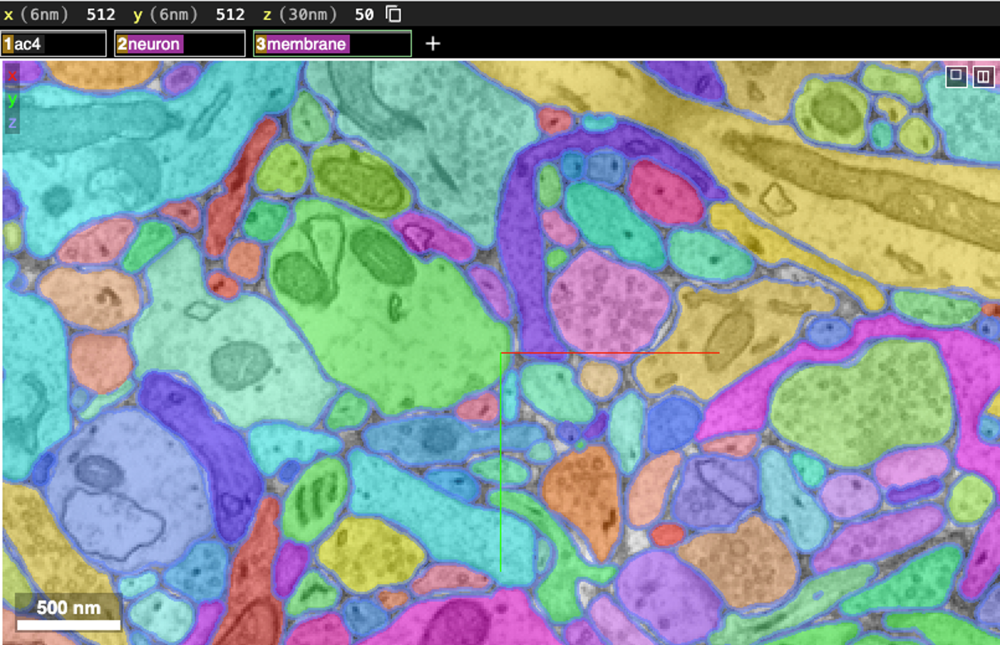 | 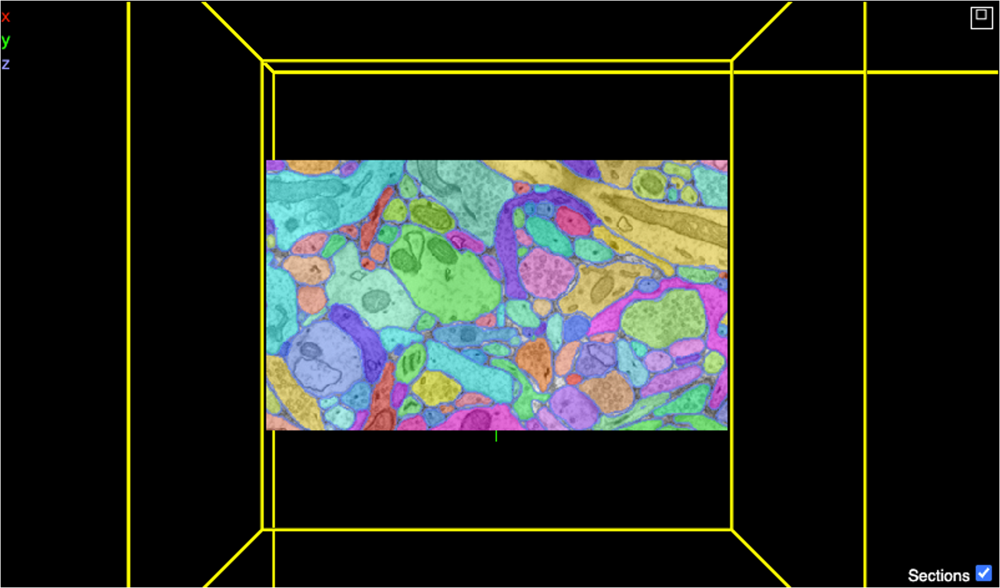 |

<br> <!-- This is another HTML line break -->



The dataset and all corresponding labels are stored publicly in [BossDB](https://bossdb.org/project/kasthuri2015) and accessed on-demand with [Intern](https://pypi.org/project/intern/), a Python API library.


## Challenge Description

Kasthuri Challenge aims to generate annotations of a saturated reconstruction of a sub-volume of mouse neocortex imaged with a scanning electron microscope. Specifically, annotations of synapses and membranes are the regions of interest as they provide the best results and insights of how machine and deep learning are able pinpoint the unique connectivity at the microstructure level. [[2]](#2)



This task assesses the capability of baseline models to accurately predict synapse locations within a sub-volume of the mouse neocortex. Specifically, the goal is to pinpoint the location and position of synapses and gauge the model's proficiency in distinguishing between distinct synaptic junctions. The synapse detection process has two categories: the synapses and the background. The core measure of success will be the model's precision in aligning its synapse detection outputs with the annotated ground truth of synapses within the specified region.

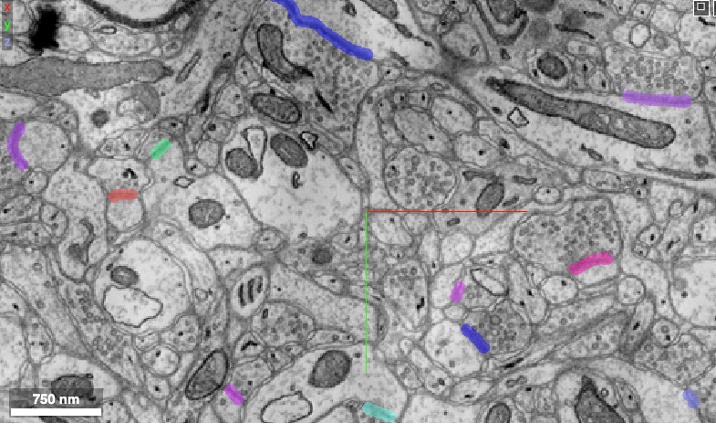


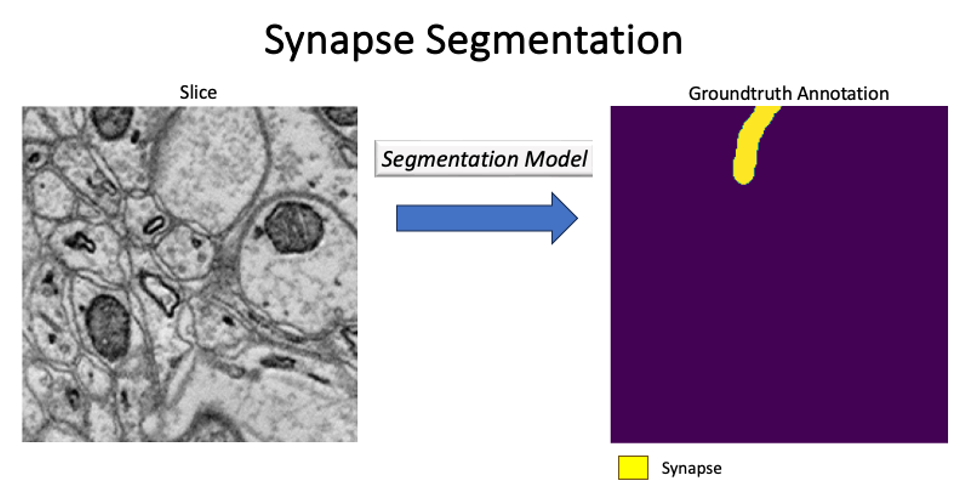

#### Train/Test Split

We use 340 images for training, 40 images for validation, and 40 images for testing.

|        | Train | Validation  | Test    |
|:------:|:-----:|:-------:|:-------:|
| Slices | 320 | 40 | 40 |

All slices denoted as "train" are concatenated to form the train dataset, and all slices denoted as "test" are concatenated to form the test dataset.

<br>

<a id="1">[1]</a> Kasthuri N, Hayworth KJ, Berger DR, Schalek RL, Conchello JA, Knowles-Barley S, Lee D, Vázquez-Reina A, Kaynig V, Jones TR, Roberts M, Morgan JL, Tapia JC, Seung HS, Roncal WG, Vogelstein JT, Burns R, Sussman DL, Priebe CE, Pfister H, Lichtman JW. Saturated Reconstruction of a Volume of Neocortex. Cell. 2015 Jul 30;162(3):648-61. doi: 10.1016/j.cell.2015.06.054. PMID: 26232230.

<a id="2">[2]</a> Quesada, J., Sathidevi, L., Liu, R., Ahad, N., Jackson, J.M., Azabou, M., ... & Dyer, E. L. (2022). MTNeuro: A Benchmark for Evaluating Representations of Brain Structure Across Multiple Levels of Abstraction. Thirty-sixth Conference on Neural Information Processing Systems Datasets and Benchmarks Track.

#### Specify the Dimensions to Train and the Number of Classes Here:

In [3]:
dimensions = 2      # 2 or 3

## Loading Data

A BossDBDataset object is initialized with the task_config dictionary, the mode of data (`"train"`, `"test"`, `"val"`), and an optional transform function. A BossDBDataset object can be passed into a PyTorch DataLoader to properly split and load in the data into batches for training/testing.

The code for the BossDBDataset can be found [here](https://github.com/MTNeuro/MTNeuro/blob/main/MTNeuro/bossdbdataset.py).



### Augment Training Data

In [5]:
class AugmentBoth:
    """A class to perform data augmentation on both image and mask.

    This class applies random rotations, random crops to a fixed size, 
    and random horizontal flips to both the input image and its corresponding mask.

    Attributes:
        p_flip (float): Probability of applying a horizontal flip. Default is 0.5.
        max_rotation (int): Maximum angle (in degrees) for random rotation. Default is 30.
    """

    def __init__(self, p_flip=0.5, max_rotation=30):
        """
        Args:
            p_flip (float, optional): Probability of applying a horizontal flip. Defaults to 0.5.
            max_rotation (int, optional): Maximum angle (in degrees) for random rotation. Defaults to 30.
        """
        self.p_flip = p_flip
        self.max_rotation = max_rotation

    def __call__(self, image, mask):
        """Apply random rotation, random crop, and random horizontal flip to the image and mask.

        Args:
            image: The input image to be augmented.
            mask: The corresponding mask to be augmented.

        Returns:
            tuple: Augmented image and mask.
        """
        # Random Rotation with a probability of 0.5
        if random.random() < 0.5:
            angle = random.uniform(-self.max_rotation, self.max_rotation)
            image = F.rotate(image, angle)
            mask = F.rotate(mask, angle)

        # Random Crop to 256x256
        i, j, h, w = RandomCrop.get_params(image, output_size=(256, 256))
        image = F.crop(image, i, j, h, w)
        mask = F.crop(mask, i, j, h, w)

        # Random Horizontal Flip
        if random.random() < self.p_flip:
            image = F.hflip(image)
            mask = F.hflip(mask)

        return image, mask


In [6]:
augmentation_transform = AugmentBoth()

### Padding for Validation and Testing Data 

### Construct Datasets

In [7]:
root = "../kasthuri/"

with open(os.path.join(root, f"taskconfig/synapse_task.json")) as file:
    task_config = json.load(file)
    

In [8]:
# Apply the transform when loading the training data, don't apply to validation and test
train_data = BossDBDataset(task_config, mode='train', transform=augmentation_transform)
val_data = BossDBDataset(task_config, mode='val')
test_data =  BossDBDataset(task_config, mode='test')

/Users/latchtd1/Documents/kasthuri_challenge/.venv/lib/python3.11/site-packages/intern/convenience/array.py:922: ImportWarning: CloudVolume is not installed. Accessing channel using CVDB.
  warnings.warn(


Unique values in mask_array before conversion: [  0 402 405 406 407 414 420 421 422 433 435 438 448 449 450 451 456 466
 468 474 478 479 485 487 488 494 495 498 512 515 519 528]
Unique values in mask_array after conversion: [0 1]
Unique values in mask_array before conversion: [  0 406 409 418 427 448 453 485 487 488 494 525]
Unique values in mask_array after conversion: [0 1]
Unique values in mask_array before conversion: [  0 409 418 427 452 453 511 525]
Unique values in mask_array after conversion: [0 1]


### Visualize the images and annotations in Train/Val/Test

## Data Visualization
#### Visualizing the First Slice and Its Groundtruth Annotation

Shape of input: torch.Size([1, 256, 256])
Shape of groundtruth annotations: torch.Size([256, 256])


/Users/latchtd1/Documents/kasthuri_challenge/kasthuri/bossdbdataset.py:240: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_numpy.cpp:212.)
  image = torch.FloatTensor(image_array) / 255.


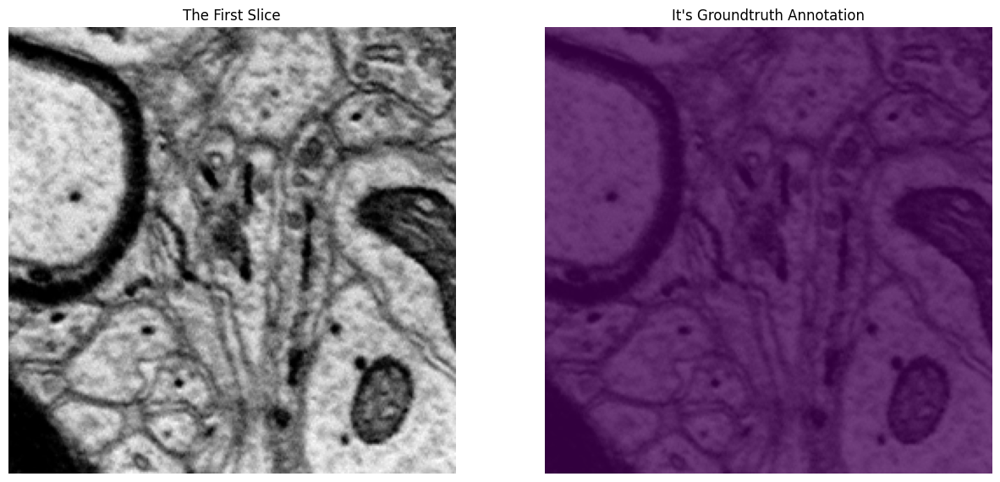

In [12]:
#Access the input and the groundtruth annotations of the first batch
input_data, annotations = train_data[0]
if dimensions == 3:
    input_data, annotations = input_data[0], annotations[0]

#Data Characteristics
print(f'Shape of input: {input_data.shape}')
print(f'Shape of groundtruth annotations: {annotations.shape}')


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))
ax1.imshow(input_data[0], cmap='gray')
ax1.title.set_text("First Slice")
ax1.axis('off')

ax2.imshow(input_data[0], cmap='gray')
ax2.imshow(annotations.squeeze(), alpha = 0.75)
ax2.title.set_text("Groundtruth Annotation")
ax2.axis('off')

plt.show()

### A Collage of Random Slices from the Training Data - Padding Slices

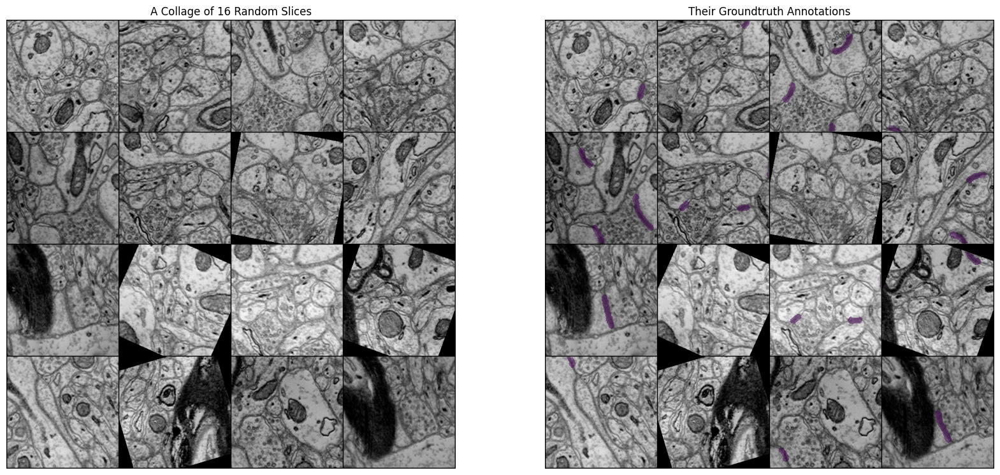

In [13]:


# Reshape data and select a random subset of 16 slices
reshaped_data = []
reshaped_annotations = []
if dimensions == 3:
    for data in train_data:
        reshaped_data = reshaped_data + list(data[0][0])
        reshaped_annotations = reshaped_annotations + list(data[1])
elif dimensions == 2:
    for data in train_data:
        reshaped_data = reshaped_data + [data[0][0]]
        reshaped_annotations = reshaped_annotations + [data[1]]

# Zip raw data and annotations together to use random.sample() once
random_samples = random.sample(list(zip(reshaped_data,reshaped_annotations)),16)

# Unzip random samples
random_samples_from_data = [random_data for random_data, random_annotations in random_samples]
random_samples_from_annotations = [random_annotations for random_data, random_annotations in random_samples]

# Find the maximum dimensions in the batch
max_height = max([tensor.shape[0] for tensor in random_samples_from_data])
max_width = max([tensor.shape[1] for tensor in random_samples_from_data])

# Pad each tensor in the batch to the maximum dimensions
padded_samples_from_data = [F.pad(tensor, (0, max_width - tensor.shape[1], 0, max_height - tensor.shape[0])) for tensor in random_samples_from_data]
padded_samples_from_annotations = [F.pad(tensor, (0, max_width - tensor.shape[1], 0, max_height - tensor.shape[0])) for tensor in random_samples_from_annotations]

# Now stack the padded tensors
grid_img_data = make_grid(torch.stack(padded_samples_from_data).unsqueeze(1), nrow=4)
grid_img_annotations = make_grid(torch.stack(padded_samples_from_annotations).unsqueeze(1), nrow=4)
masked_annotations = np.ma.masked_where(grid_img_annotations == 0, grid_img_annotations)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,20))
ax1.imshow(grid_img_data[0], cmap='gray')
ax1.title.set_text("A Collage of 16 Random Slices")
ax1.axis("off")

ax2.imshow(grid_img_data[0], cmap='gray')
ax2.imshow(masked_annotations[0], alpha = 0.5)
ax2.title.set_text("Groundtruth Annotations")
ax2.axis('off')
#ax2.legend(handles=legend_elements)

plt.show()


## Building the Model

This notebook uses UNet as an example baseline model on which to execute Task 2. UNet, a modified fully convolutional neural network that is optimized for biomedical image segmentation, features a U-shaped symmetric contracting and expanding path which can quickly segment all pixels of an input image. [[3]](#3)

See a tutorial and walkthrough of UNet [here](https://github.com/johschmidt42/PyTorch-2D-3D-UNet-Tutorial).
See the paper that details UNet's architecture and usage [here](https://arxiv.org/pdf/1505.04597.pdf). 

<img src="https://raw.githubusercontent.com/MTNeuro/MTNeuro/main/notebooks/images/unet.PNG" alt="UNet" style="width: 80%;">

<a id="3" href="https://arxiv.org/pdf/1505.04597.pdf" target="_blank">[3]</a> Ronneberger, O., Fischer, P., & Brox T. (2015). U-Net: Convolutional Networks for Biomedical Image Segmentation. Medical Image Computing and Computer Assisted Intervention Society.

#### Simply comment out the model you want to train

In [ ]:
#Load the network config for the specified setting (Contains the batch size and model config information)

model_type = "unet"
# model_type = "depth"
# model_type = "residual"
# model_type = "attention"

In [ ]:
# Load the appropriate network configurations JSON files

# dictionary, list, set of models 
if model_type == "unet":
    with open(os.path.join(root, f"networkconfig/UNet_{dimensions}D.json")) as file:
        network_config = json.load(file)
else:
    with open(os.path.join(root, f"networkconfig/UNet_{dimensions}D_{model_type}.json")) as file:
        network_config = json.load(file)

In [ ]:
print(file) # check the correct JSON is being loaded

#### Importing correct UNET file based on selection

In [ ]:
# Dynamically import the appropriate UNet based on model_type
if model_type == "attention":
    from kasthuri.models.unet_attention import UNet
elif model_type == "residual":
    from kasthuri.models.unet_residual import UNet
elif model_type == "depth":
    from kasthuri.models.unet_depth import UNet
else:  # default to the standard UNet
    from kasthuri.models.unet import UNet

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [14]:
# Load the model with the configuration specified through the network configurations file.
print('Loading UNet Model')
model = UNet(in_channels = network_config['in_channels'],
             out_channels = network_config['classes'],
             n_blocks = network_config['n_blocks'],
             start_filters = network_config['start_filters'],
             activation = network_config['activation'],
             normalization = network_config['normalization'],
             conv_mode = network_config['conv_mode'],
             dim = network_config['dim']
            ).to(device)

Loading UNet Model


## Training the Model

The Trainer object assists with training a specified model with data that is feeded in through a DataLoader. Some of its initialization arguments are specified from this notebook, and some are specified through the network configuration JSON file. 

Trainer.run_trainer() initiates the model training process.

The script for Trainer can be found [here](https://github.com/MTNeuro/MTNeuro/blob/main/MTNeuro/trainer.py).

#### Setting the Loss Function and the Optimizer

In [15]:
# Loss criterion
criterion = torch.nn.CrossEntropyLoss()

# Optimizer (Utilizes the network config file)
if network_config["optimizer"] == "SGD":
    optimizer = torch.optim.SGD(model.parameters(), lr=network_config["learning_rate"])
if network_config["optimizer"] == "Adam":
    optimizer = torch.optim.Adam(model.parameters(), lr=network_config["learning_rate"], betas=(network_config["beta1"],network_config["beta2"]))
 

#### Configuring the DataLoader

Documentation on the PyTorch DataLoader can be found [here](https://pytorch.org/docs/stable/data.html).

In [16]:
train_dataloader = DataLoader(dataset=train_data,
                              batch_size=network_config['batch_size'],
                              shuffle=True)
validation_dataloader = DataLoader(dataset=val_data,
                                   batch_size=network_config['batch_size'],
                                   shuffle=True)
test_dataloader = DataLoader(dataset=test_data,
                             batch_size=network_config['batch_size'],
                             shuffle=True)

#### Set epochs, and incorporate scheduler in training

In [18]:
# Adjust the number of epochs
epochs = 30  # Adjusted number of epochs

In [19]:
# Introduce a learning rate scheduler
scheduler = ReduceLROnPlateau(optimizer, 'min', patience=5, factor=0.5)

In [20]:
trainer = Trainer(
    model=model,
    device=device,
    criterion=criterion,
    optimizer=optimizer,
    training_DataLoader=train_dataloader,
    validation_DataLoader=validation_dataloader,
    lr_scheduler=scheduler,  # <-- Pass the scheduler here
    epochs=epochs,
    notebook=True
)


In [21]:
training_losses, validation_losses, lr_rates = trainer.run_trainer()

Progress:   0%|          | 0/30 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

### Saved your train model (in the same directory as Notebooks)

In [22]:
task = "synapse"

# Construct the path to the model weights based on the model_name and task
if model_type == 'unet':
    model_save_path = 'UNet_2D_' + str(task) + '.pth'
else:
    model_save_path = 'UNet_2D_' + str(model_type) + '_' + str(task) + '.pth'

torch.save(model.state_dict(), model_save_path)

## Evaluating the Model

In [23]:
def predict(img, model, device):
    """Segments the pixels of a slice using a trained model.
    """
    model.eval()
    x = img.to(device)                     #send input to device
    with torch.inference_mode():
        out = model(x)                     #model forward pass
    out_argmax = torch.argmax(out, dim=1)  #perform softmax on outputs
    return out_argmax

#### Model Prediction

The trained model is tested with the test_dataloader that was initialized when the test dataset was downloaded from BossDB. We keep track of the true positive, false positive, false negative, and true negative scores in tensors for use later. 

In [24]:
# Variables for storing the True Postive, False Positive, False Negative and True Negative scores respectively
tp_tot = torch.empty(0,network_config['classes'])
fp_tot = torch.empty(0,network_config['classes'])
fn_tot = torch.empty(0,network_config['classes'])
tn_tot = torch.empty(0,network_config['classes'])

# Predict on test data
for x, y in test_dataloader:
    target = y.to(device) 
    # Segment the input image with the model
    output = predict(x, model, device)
    # Using segmentation_models_pytorch to calculate the statistics
    tp, fp, fn, tn = smp.metrics.get_stats(output, target, mode='multiclass', num_classes = network_config['classes'])
    tp_tot = torch.vstack((tp_tot,tp))
    fp_tot = torch.vstack((fp_tot,fp))
    fn_tot = torch.vstack((fn_tot,fn))
    tn_tot = torch.vstack((tn_tot,tn))

#### Visualizing Model Predictions

One slice, its groundtruth annotation, and the model's predicted annotations are visualized below. Visualizations use the same legend and cmap as the visualizations in above cells.

**Note: If you observe any lack of quality in predictions, you can think of the number of epochs the training is run for. This can be set in the task config file which is being loaded**

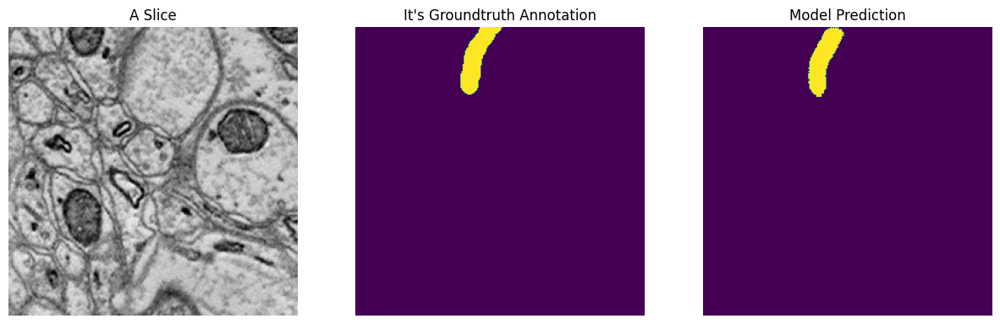

In [25]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 15))
ax1.imshow(x.squeeze()[0], cmap='gray')
ax1.title.set_text("Slice")
ax1.axis('off')

ax2.imshow(y.squeeze()[0])  
ax2.title.set_text("Groundtruth Annotation")
ax2.axis('off')
#ax2.legend(handles=legend_elements) 

ax3.imshow(output.cpu().squeeze()[0]) 
ax3.title.set_text("Model Prediction")
ax3.axis('off')
#ax3.legend(handles=legend_elements) 

plt.show()

#### Calculating Performance Metrics

Metric Calculations:

$$
\begin{aligned}
\text{Accuracy: }&\frac{tp + tn}{fp + tn + fn + tp}\\\\
\text{Balanced Accuracy: }&\frac{\text{Specificity} + \text{Sensitivity}}{2}\\\\
\text{F1-Score: }&\frac{2\cdot \text{precision} \cdot \text{recall}}{\text{precision} + \text{recall}}\\\\
\text{IoU: }&\frac{tp}{fp + fn + tp}
\end{aligned}
$$

Where tp = true positive, tn = true negative, fp = false positive, and fn = false negative.

In [26]:
# Accuracy
acc = (tp_tot.mean(dim=0)+tn_tot.mean(dim=0))/(fp_tot.mean(dim=0)+tn_tot.mean(dim=0)+fn_tot.mean(dim=0)+tp_tot.mean(dim=0)) 
print('Accuracy per Class:', np.array(acc.cpu()))

# Balanced Accuracy
spec =  (tn_tot[:,1:].mean())/(fp_tot[:,1:].mean()+tn_tot[:,1:].mean())
sens =  (tp_tot[:,1:].mean())/(fn_tot[:,1:].mean()+tp_tot[:,1:].mean())
balacc = (spec + sens)/2
print(f'Balanced Accuracy (No Background): {balacc}')

# F1-score
prec = tp_tot.mean(dim=0)/(fp_tot.mean(dim=0)+tp_tot.mean(dim=0))
reca = tp_tot.mean(dim=0)/(fn_tot.mean(dim=0)+tp_tot.mean(dim=0))
f1 = (2*reca*prec)/(reca+prec)
print(f'F1-Score: {np.array(f1.cpu())}\nAvg. F1-Score: {f1.mean()}')

# IoU
iou = (tp_tot.mean(0))/(fp_tot.mean(0)+fn_tot.mean(0)+tp_tot.mean(0))
print(f'IoU: {np.array(iou.cpu())}\nAvg. IoU-Score: {iou.mean()}')

Accuracy per Class: [0.9923004  0.99230045]
Balanced Accuracy (No Background): 0.6327617168426514
F1-Score: [0.9961264  0.37336227]
Avg. F1-Score: 0.6847443580627441
IoU: [0.9922827 0.2295301]
Avg. IoU-Score: 0.6109063625335693


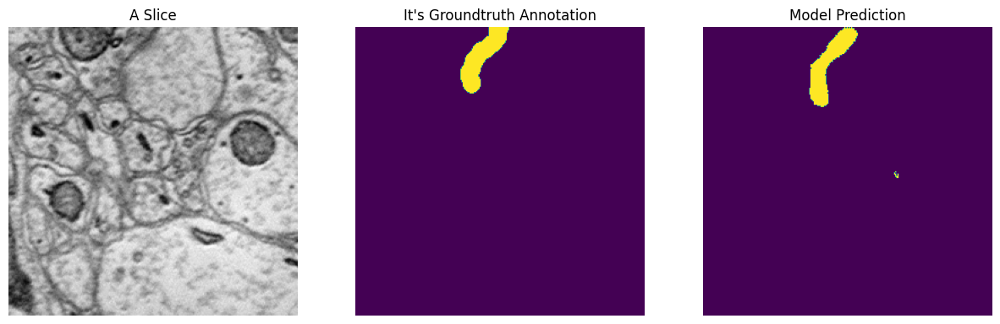

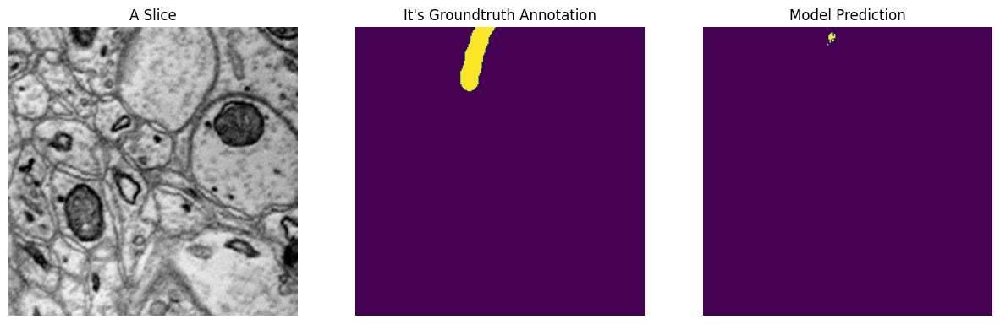

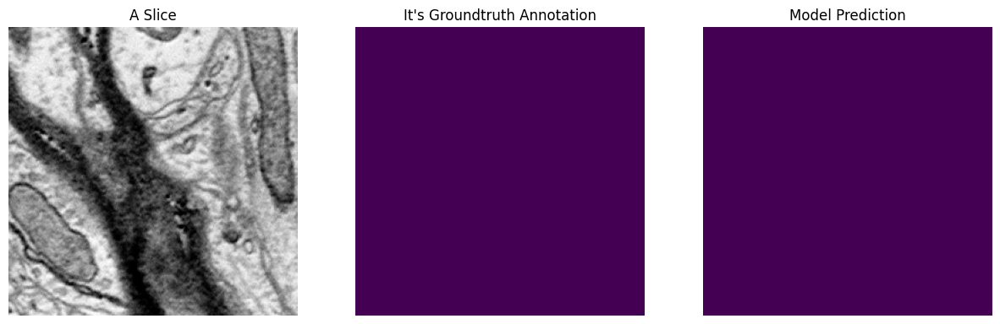

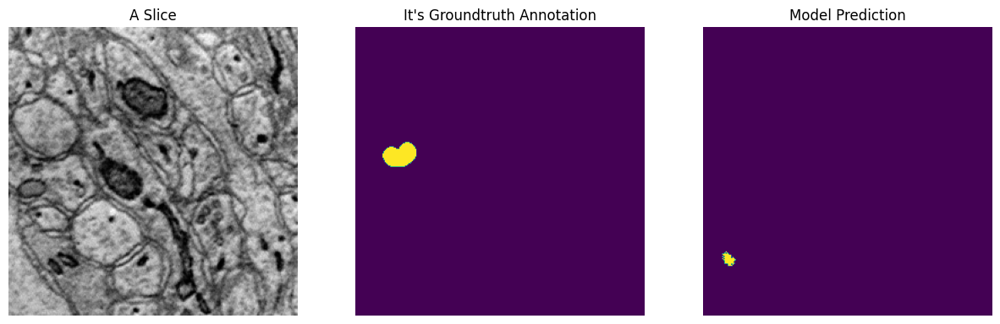

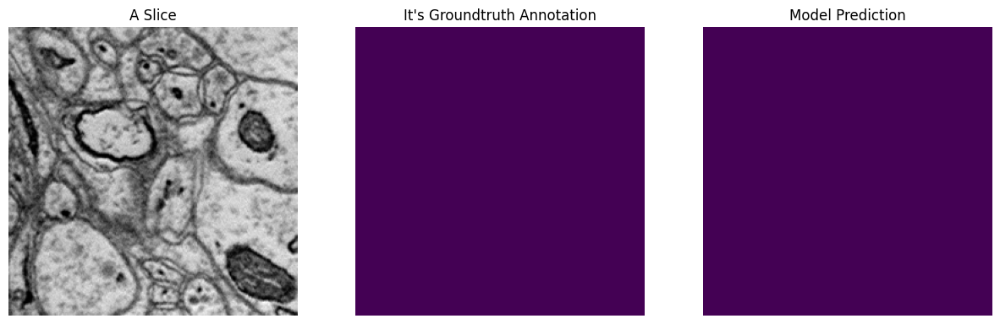

...

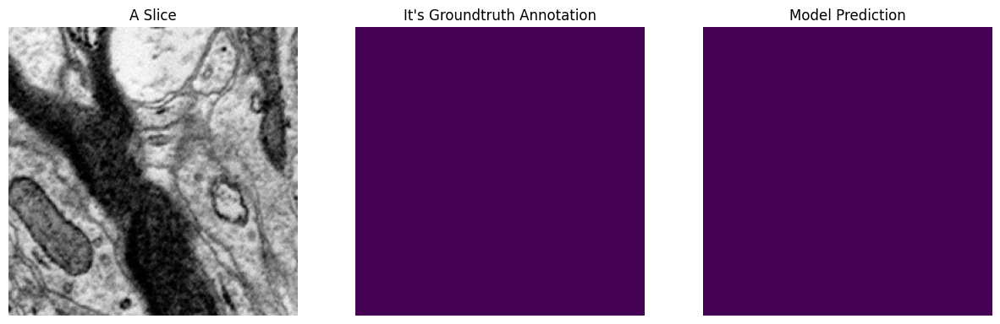

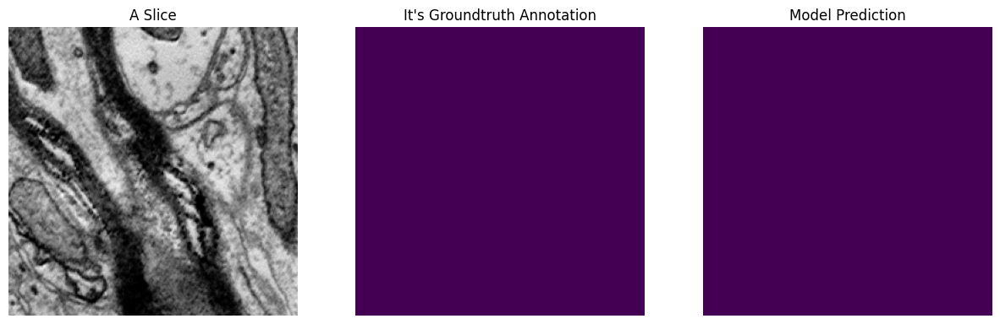

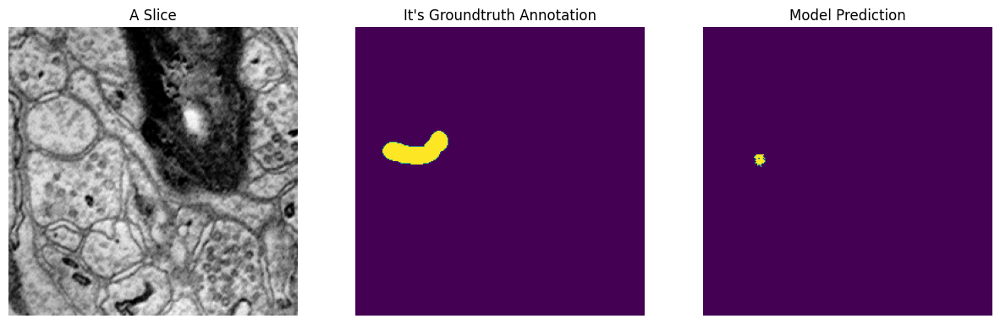

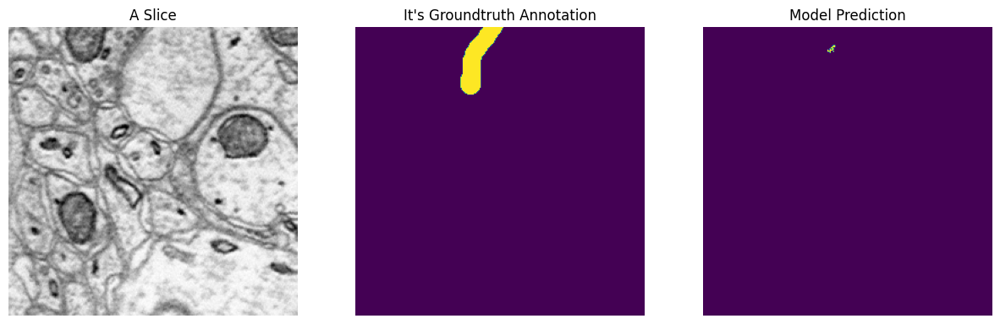

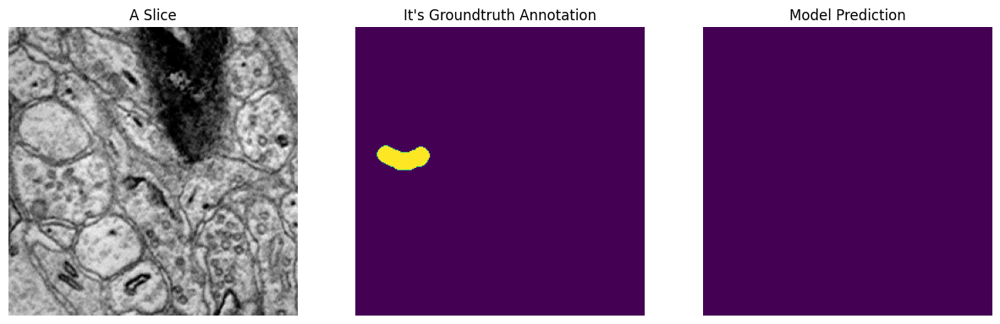

Accuracy per Class: [0.9923004  0.99230045]
Balanced Accuracy (No Background): 0.6327617168426514
F1-Score: [0.9961264  0.37336227]
Avg. F1-Score: 0.6847443580627441
IoU: [0.9922827 0.2295301]
Avg. IoU-Score: 0.6109063625335693


In [27]:
# Variables for storing the True Positive, False Positive, False Negative, and True Negative scores respectively
tp_tot = torch.empty(0, network_config['classes'])
fp_tot = torch.empty(0, network_config['classes'])
fn_tot = torch.empty(0, network_config['classes'])
tn_tot = torch.empty(0, network_config['classes'])

# Predict on test data
for x_batch, y_batch in test_dataloader:
    for i in range(x_batch.size(0)):  # iterate over each slice in the batch
        x = x_batch[i].unsqueeze(0)  # add a batch dimension
        y = y_batch[i].unsqueeze(0)  # add a batch dimension
        
        target = y.to(device) 
        # Segment the input image with the model
        output = predict(x, model, device)
        # Using segmentation_models_pytorch to calculate the statistics
        tp, fp, fn, tn = smp.metrics.get_stats(output, target, mode='multiclass', num_classes=network_config['classes'])
        tp_tot = torch.vstack((tp_tot, tp))
        fp_tot = torch.vstack((fp_tot, fp))
        fn_tot = torch.vstack((fn_tot, fn))
        tn_tot = torch.vstack((tn_tot, tn))
        
        # Visualization
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 15))
        ax1.imshow(x.squeeze(), cmap='gray')
        ax1.title.set_text("Slice")
        ax1.axis('off')

        ax2.imshow(y.squeeze())  
        ax2.title.set_text("Groundtruth Annotation")
        ax2.axis('off')

        ax3.imshow(output.cpu().squeeze()) 
        ax3.title.set_text("Model Prediction")
        ax3.axis('off')

        plt.show()

# Accuracy
acc = (tp_tot.mean(dim=0)+tn_tot.mean(dim=0))/(fp_tot.mean(dim=0)+tn_tot.mean(dim=0)+fn_tot.mean(dim=0)+tp_tot.mean(dim=0)) 
print('Accuracy per Class:', np.array(acc.cpu()))

# Balanced Accuracy
spec =  (tn_tot[:,1:].mean())/(fp_tot[:,1:].mean()+tn_tot[:,1:].mean())
sens =  (tp_tot[:,1:].mean())/(fn_tot[:,1:].mean()+tp_tot[:,1:].mean())
balacc = (spec + sens)/2
print(f'Balanced Accuracy (No Background): {balacc}')

# F1-score
prec = tp_tot.mean(dim=0)/(fp_tot.mean(dim=0)+tp_tot.mean(dim=0))
reca = tp_tot.mean(dim=0)/(fn_tot.mean(dim=0)+tp_tot.mean(dim=0))
f1 = (2*reca*prec)/(reca+prec)
print(f'F1-Score: {np.array(f1.cpu())}\nAvg. F1-Score: {f1.mean()}')

# IoU
iou = (tp_tot.mean(0))/(fp_tot.mean(0)+fn_tot.mean(0)+tp_tot.mean(0))
print(f'IoU: {np.array(iou.cpu())}\nAvg. IoU-Score: {iou.mean()}')
